***DISCRIMINATIVE PROJECT***

***GROUP-6***

**INITIALIZING SYSTEM ENVIRONMENT SETUP**

In [ ]:
import os

**VERIFYING GOOGLE DRIVE CONTENTS**


In [ ]:
!ls '/content/drive/MyDrive'

'Colab Notebooks'		      image_OBJ787  'LOR 3.pdf'
'course completion.pdf'		     'LOR 1.pdf'     resized_images.zip
'Discriminative Project Milstone_1'  'LOR 2.pdf'


**MOUNTING GOOGLE DRIVE STORAGE**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**INSPECTING PROJECT DATASET DIRECTORY**


In [ ]:
!ls '/content/drive/MyDrive/Discriminative Project Milstone_1'

image_OBJ007   images_OBJ005  images_OBJ019  images_OBJ095  images_OBJ230
image_OBJ027   images_OBJ006  images_OBJ021  images_OBJ107  images_OBJ_300
image_OBJ090   images_OBJ008  images_OBJ022  images_OBJ108  images_OBJ311
image_OBJ787   images_OBJ009  images_OBJ028  images_OBJ111  images_OBJ405
images_OBJ001  images_OBJ010  images_OBJ029  images_OBJ159  IMAGES_OBJ786
images_OBJ002  images_OBJ012  images_OBJ031  images_OBJ208  IMAGES_OBJ788
images_OBJ003  images_OBJ016  images_OBJ061  images_OBJ222  IMAGES_OBJ789
images_OBJ004  images_OBJ018  Images_OBJ069  images_OBJ229


**VERIFYING GPU AND CUDA AVAILABILITY**


In [ ]:
import torch
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA available: True
GPU: NVIDIA A100-SXM4-40GB


**IMPORTING REQUIRED DATA PROCESSING LIBRARIES**


In [ ]:
import os
import cv2
import numpy as np

print("Libraries imported successfully.")

Libraries imported successfully.


**LOADING AND PREPROCESSING IMAGE DATASET**


In [ ]:
dataset_path = '/content/drive/MyDrive/Discriminative Project Milstone_1'
image_size = (64, 64) # Define a consistent image size

images = []
labels = []

# Iterate through each subdirectory (which represents a class/label)
for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        # Iterate through all image files within the subdirectory
        for image_name in os.listdir(class_path):
            if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_path = os.path.join(class_path, image_name)

                # Load the image
                img = cv2.imread(image_path)

                if img is not None:
                    # Resize the image to a consistent dimension
                    img = cv2.resize(img, image_size)

                    # Convert to NumPy array and normalize pixel values to [0, 1]
                    img = np.array(img, dtype=np.float32) / 255.0

                    # Append the preprocessed image and its label
                    images.append(img)
                    labels.append(class_name)
                else:
                    print(f"Warning: Could not load image {image_path}")

# Convert the lists of images and labels into NumPy arrays
images = np.array(images)
labels = np.array(labels)

print(f"Loaded {len(images)} images with {len(np.unique(labels))} unique labels.")
print(f"Shape of images array: {images.shape}")
print(f"Shape of labels array: {labels.shape}")
print(f"Example labels: {labels[:5]}")


Loaded 4108 images with 39 unique labels.
Shape of images array: (4108, 64, 64, 3)
Shape of labels array: (4108,)
Example labels: ['image_OBJ787' 'image_OBJ787' 'image_OBJ787' 'image_OBJ787'
 'image_OBJ787']


**ENCODING LABELS AND SPLITTING DATASET**


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

# Encode the string labels to integers
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

# Convert integer labels to one-hot encoded vectors
num_classes = len(np.unique(labels_encoded))
labels_categorical = to_categorical(labels_encoded, num_classes=num_classes)

# Split the dataset into 70% training and 30% testing
# stratify ensures that the class distribution is preserved in the train and test sets
X_train, X_test, y_train, y_test = train_test_split(images, labels_categorical, test_size=0.3, random_state=42, stratify=labels_encoded)

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (2875, 64, 64, 3)
X_test shape: (1233, 64, 64, 3)
y_train shape: (2875, 39)
y_test shape: (1233, 39)


**DESIGNING AND COMPILING MULTIPLE CNN ARCHITECTURES**


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

input_shape = (64, 64, 3)

# 1. Baseline Model
model_baseline = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(num_classes, activation='softmax')
])

model_baseline.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# 2. Deeper Model
model_deeper = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model_deeper.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# 3. Dropout Model
model_dropout = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model_dropout.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display summaries
print("Baseline Model Summary:")
model_baseline.summary()
print("\nDeeper Model Summary:")
model_deeper.summary()
print("\nDropout Model Summary:")
model_dropout.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Baseline Model Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 62, 62, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 31, 31, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 30752)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 39)             │     1,199,367 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,200,263 (4.58 MB)

 Trainable params: 1,200,263 (4.58 MB)

 Non-trainable params: 0 (0.00 B)


Deeper Model Summary:


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 62, 62, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 31, 31, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 29, 29, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 12, 12, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │       589,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 39)             │         5,031 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 688,231 (2.63 MB)

 Trainable params: 688,231 (2.63 MB)

 Non-trainable params: 0 (0.00 B)


Dropout Model Summary:


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 62, 62, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 31, 31, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 29, 29, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 12, 12, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │       589,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 39)             │         5,031 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 688,231 (2.63 MB)

 Trainable params: 688,231 (2.63 MB)

 Non-trainable params: 0 (0.00 B)

**REFINING CNN MODELS WITH INPUT LAYER**


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input

input_shape = (64, 64, 3)

# 1. Baseline Model
model_baseline = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(num_classes, activation='softmax')
])

model_baseline.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# 2. Deeper Model
model_deeper = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(num_classes, activation='softmax')
])

model_deeper.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# 3. Dropout Model
model_dropout = Sequential([
    Input(shape=input_shape),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

model_dropout.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display summaries
print("Baseline Model Summary:")
model_baseline.summary()
print("\nDeeper Model Summary:")
model_deeper.summary()
print("\nDropout Model Summary:")
model_dropout.summary()

Baseline Model Summary:


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)               │ (None, 62, 62, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 31, 31, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 30752)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 39)             │     1,199,367 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,200,263 (4.58 MB)

 Trainable params: 1,200,263 (4.58 MB)

 Non-trainable params: 0 (0.00 B)


Deeper Model Summary:


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 62, 62, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 31, 31, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 29, 29, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 12, 12, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       589,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 39)             │         5,031 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 688,231 (2.63 MB)

 Trainable params: 688,231 (2.63 MB)

 Non-trainable params: 0 (0.00 B)


Dropout Model Summary:


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_11 (Conv2D)              │ (None, 62, 62, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 31, 31, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 29, 29, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 12, 12, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 6, 6, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │       589,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 39)             │         5,031 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 688,231 (2.63 MB)

 Trainable params: 688,231 (2.63 MB)

 Non-trainable params: 0 (0.00 B)

**TRAINING AND VALIDATING ALL CNN MODELS**


In [ ]:
# Train Baseline Model
print("Training Baseline Model...")
history_baseline = model_baseline.fit(
    X_train, y_train,
    epochs=15,
    batch_size=32,
    validation_data=(X_test, y_test),
    verbose=1
)

# Train Deeper Model
print("\nTraining Deeper Model...")
history_deeper = model_deeper.fit(
    X_train, y_train,
    epochs=15,
    batch_size=32,
    validation_data=(X_test, y_test),
    verbose=1
)

# Train Dropout Model
print("\nTraining Dropout Model...")
history_dropout = model_dropout.fit(
    X_train, y_train,
    epochs=15,
    batch_size=32,
    validation_data=(X_test, y_test),
    verbose=1
)

print("\nAll models trained successfully.")

Training Baseline Model...
Epoch 1/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - accuracy: 1.0000 - loss: 0.0095 - val_accuracy: 0.8232 - val_loss: 0.7320
Epoch 2/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - accuracy: 1.0000 - loss: 0.0078 - val_accuracy: 0.8191 - val_loss: 0.7449
Epoch 3/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 19s 128ms/step - accuracy: 1.0000 - loss: 0.0070 - val_accuracy: 0.8191 - val_loss: 0.7474
Epoch 4/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - accuracy: 1.0000 - loss: 0.0060 - val_accuracy: 0.8216 - val_loss: 0.7350
Epoch 5/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 12s 138ms/step - accuracy: 1.0000 - loss: 0.0055 - val_accuracy: 0.8183 - val_loss: 0.7575
Epoch 6/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - accuracy: 1.0000 - loss: 0.0049 - val_accuracy: 0.8240 - val_loss: 0.7571
Epoch 7/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - accuracy: 1.0000 - loss: 0.0041 - val_accuracy: 0.8159 - val_loss: 0.7877
Epoch 8/15
90/90 ━━━━━━━━━━━━━━━━━━━━ 11s 127ms/step - accuracy: 1.000

**EVALUATING, COMPARING, AND VISUALIZING MODEL PERFORMANCE**


EVALUATING MODELS ON TEST SET

1. Baseline Model:
   Loss: 0.7921
   Accuracy: 0.8183
   Precision: 0.8197
   Recall: 0.8183
   F1-Score: 0.8159

2. Deeper Model:
   Loss: 0.7381
   Accuracy: 0.8905
   Precision: 0.8926
   Recall: 0.8905
   F1-Score: 0.8894

3. Dropout Model:
   Loss: 0.5821
   Accuracy: 0.8767
   Precision: 0.8819
   Recall: 0.8767
   F1-Score: 0.8764

MODEL COMPARISON TABLE

   Model  Test Accuracy  Test Loss  Precision   Recall  F1-Score  Parameters
  Deeper       0.890511   0.738076   0.892573 0.890511  0.889435      688231
 Dropout       0.876723   0.582109   0.881881 0.876723  0.876367      688231
Baseline       0.818329   0.792083   0.819716 0.818329  0.815888     1200263

🏆 BEST MODEL: Deeper
   Test Accuracy: 0.8905


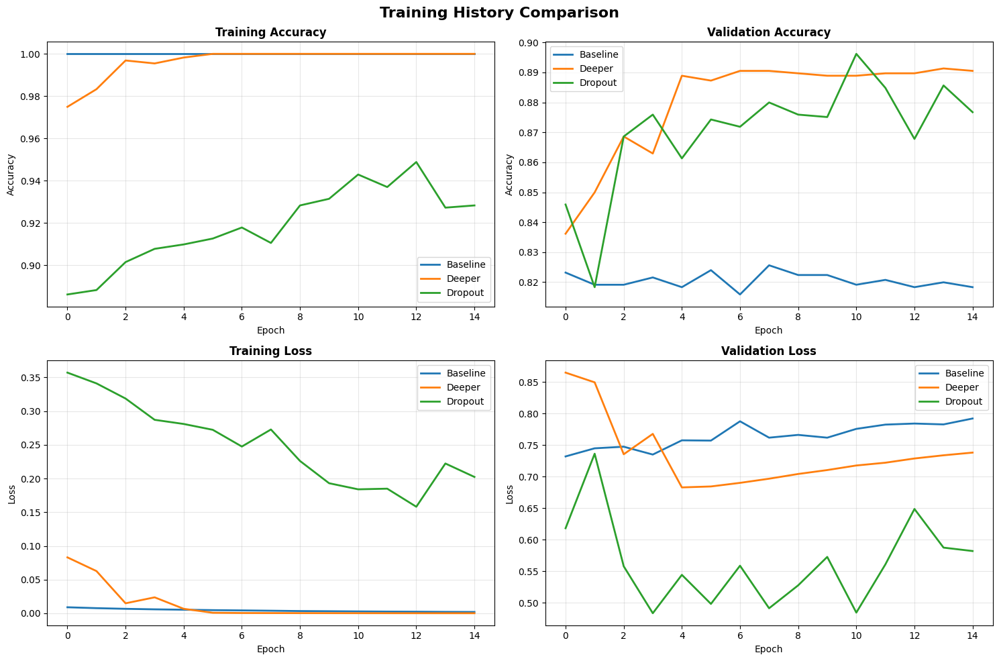


✓ Training history plot saved as 'training_comparison.png'


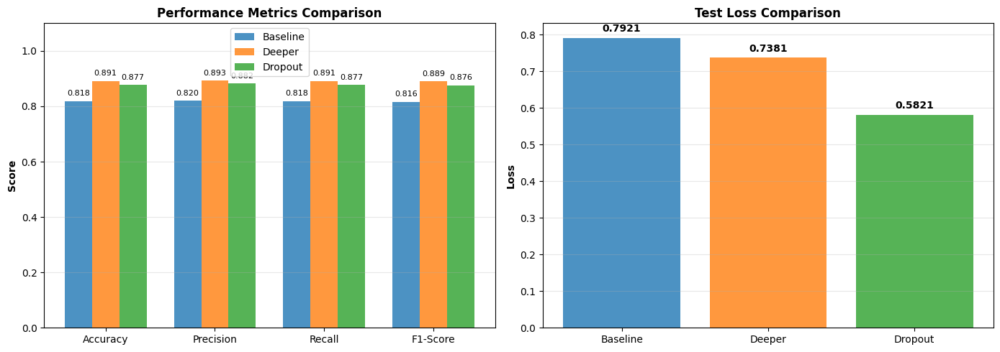

✓ Metrics comparison plot saved as 'metrics_comparison.png'


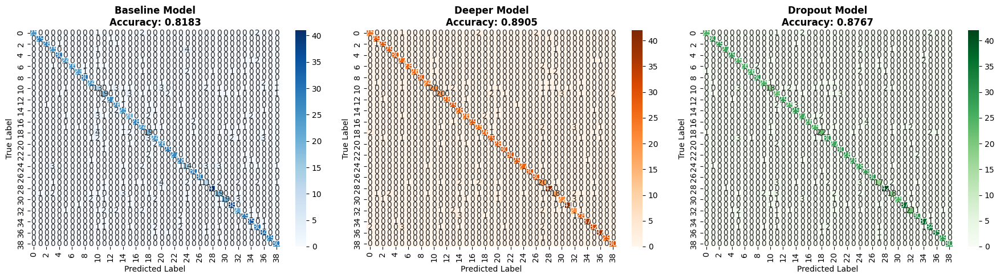

✓ Confusion matrices saved as 'confusion_matrices.png'

DETAILED CLASSIFICATION REPORTS

1. BASELINE MODEL:
------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        30
           1       0.97      0.97      0.97        30
           2       0.97      0.93      0.95        30
           3       0.78      0.83      0.81        30
           4       0.94      1.00      0.97        30
           5       0.86      0.80      0.83        30
           6       1.00      0.87      0.93        30
           7       0.92      0.77      0.84        30
           8       0.94      1.00      0.97        30
           9       0.83      0.80      0.81        30
          10       0.42      0.43      0.43        30
          11       0.58      0.63      0.60        30
          12       0.93      0.90      0.92        30
          13       0.76      0.87      0.81        30
          14       0

In [ ]:
# EVALUATION AND COMPARISON OF ALL 3 MODELS


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

# EVALUATE EACH MODEL ON TEST SET

print("="*60)
print("EVALUATING MODELS ON TEST SET")
print("="*60)

# Evaluate Baseline Model
print("\n1. Baseline Model:")
loss_baseline, acc_baseline = model_baseline.evaluate(X_test, y_test, verbose=0)
y_pred_baseline = np.argmax(model_baseline.predict(X_test, verbose=0), axis=1)
y_true = np.argmax(y_test, axis=1) if len(y_test.shape) > 1 else y_test

precision_baseline, recall_baseline, f1_baseline, _ = precision_recall_fscore_support(
    y_true, y_pred_baseline, average='weighted', zero_division=0
)

print(f"   Loss: {loss_baseline:.4f}")
print(f"   Accuracy: {acc_baseline:.4f}")
print(f"   Precision: {precision_baseline:.4f}")
print(f"   Recall: {recall_baseline:.4f}")
print(f"   F1-Score: {f1_baseline:.4f}")

# Evaluate Deeper Model
print("\n2. Deeper Model:")
loss_deeper, acc_deeper = model_deeper.evaluate(X_test, y_test, verbose=0)
y_pred_deeper = np.argmax(model_deeper.predict(X_test, verbose=0), axis=1)

precision_deeper, recall_deeper, f1_deeper, _ = precision_recall_fscore_support(
    y_true, y_pred_deeper, average='weighted', zero_division=0
)

print(f"   Loss: {loss_deeper:.4f}")
print(f"   Accuracy: {acc_deeper:.4f}")
print(f"   Precision: {precision_deeper:.4f}")
print(f"   Recall: {recall_deeper:.4f}")
print(f"   F1-Score: {f1_deeper:.4f}")

# Evaluate Dropout Model
print("\n3. Dropout Model:")
loss_dropout, acc_dropout = model_dropout.evaluate(X_test, y_test, verbose=0)
y_pred_dropout = np.argmax(model_dropout.predict(X_test, verbose=0), axis=1)

precision_dropout, recall_dropout, f1_dropout, _ = precision_recall_fscore_support(
    y_true, y_pred_dropout, average='weighted', zero_division=0
)

print(f"   Loss: {loss_dropout:.4f}")
print(f"   Accuracy: {acc_dropout:.4f}")
print(f"   Precision: {precision_dropout:.4f}")
print(f"   Recall: {recall_dropout:.4f}")
print(f"   F1-Score: {f1_dropout:.4f}")

# CREATE COMPARISON DATAFRAME


comparison_data = {
    'Model': ['Baseline', 'Deeper', 'Dropout'],
    'Test Accuracy': [acc_baseline, acc_deeper, acc_dropout],
    'Test Loss': [loss_baseline, loss_deeper, loss_dropout],
    'Precision': [precision_baseline, precision_deeper, precision_dropout],
    'Recall': [recall_baseline, recall_deeper, recall_dropout],
    'F1-Score': [f1_baseline, f1_deeper, f1_dropout],
    'Parameters': [
        model_baseline.count_params(),
        model_deeper.count_params(),
        model_dropout.count_params()
    ]
}

comparison_df = pd.DataFrame(comparison_data)
comparison_df = comparison_df.sort_values('Test Accuracy', ascending=False)

print("\n" + "="*60)
print("MODEL COMPARISON TABLE")
print("="*60 + "\n")
print(comparison_df.to_string(index=False))

# Find best model
best_model_idx = comparison_df['Test Accuracy'].idxmax()
best_model_name = comparison_df.loc[best_model_idx, 'Model']
best_accuracy = comparison_df.loc[best_model_idx, 'Test Accuracy']

print(f"\n BEST MODEL: {best_model_name}")
print(f"   Test Accuracy: {best_accuracy:.4f}")

# VISUALIZE TRAINING HISTORY


fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Training History Comparison', fontsize=16, fontweight='bold')

# Training Accuracy
ax = axes[0, 0]
ax.plot(history_baseline.history['accuracy'], label='Baseline', linewidth=2)
ax.plot(history_deeper.history['accuracy'], label='Deeper', linewidth=2)
ax.plot(history_dropout.history['accuracy'], label='Dropout', linewidth=2)
ax.set_title('Training Accuracy', fontsize=12, fontweight='bold')
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy')
ax.legend()
ax.grid(True, alpha=0.3)

# Validation Accuracy
ax = axes[0, 1]
ax.plot(history_baseline.history['val_accuracy'], label='Baseline', linewidth=2)
ax.plot(history_deeper.history['val_accuracy'], label='Deeper', linewidth=2)
ax.plot(history_dropout.history['val_accuracy'], label='Dropout', linewidth=2)
ax.set_title('Validation Accuracy', fontsize=12, fontweight='bold')
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy')
ax.legend()
ax.grid(True, alpha=0.3)

# Training Loss
ax = axes[1, 0]
ax.plot(history_baseline.history['loss'], label='Baseline', linewidth=2)
ax.plot(history_deeper.history['loss'], label='Deeper', linewidth=2)
ax.plot(history_dropout.history['loss'], label='Dropout', linewidth=2)
ax.set_title('Training Loss', fontsize=12, fontweight='bold')
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.legend()
ax.grid(True, alpha=0.3)

# Validation Loss
ax = axes[1, 1]
ax.plot(history_baseline.history['val_loss'], label='Baseline', linewidth=2)
ax.plot(history_deeper.history['val_loss'], label='Deeper', linewidth=2)
ax.plot(history_dropout.history['val_loss'], label='Dropout', linewidth=2)
ax.set_title('Validation Loss', fontsize=12, fontweight='bold')
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Training history plot saved as 'training_comparison.png'")

# BAR CHART COMPARISON


fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Metrics Comparison
ax = axes[0]
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
baseline_metrics = [acc_baseline, precision_baseline, recall_baseline, f1_baseline]
deeper_metrics = [acc_deeper, precision_deeper, recall_deeper, f1_deeper]
dropout_metrics = [acc_dropout, precision_dropout, recall_dropout, f1_dropout]

x = np.arange(len(metrics))
width = 0.25

ax.bar(x - width, baseline_metrics, width, label='Baseline', alpha=0.8)
ax.bar(x, deeper_metrics, width, label='Deeper', alpha=0.8)
ax.bar(x + width, dropout_metrics, width, label='Dropout', alpha=0.8)

ax.set_ylabel('Score', fontweight='bold')
ax.set_title('Performance Metrics Comparison', fontsize=12, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()
ax.grid(True, axis='y', alpha=0.3)
ax.set_ylim([0, 1.1])

# Add value labels on bars
for i, (b, d, dr) in enumerate(zip(baseline_metrics, deeper_metrics, dropout_metrics)):
    ax.text(i - width, b + 0.02, f'{b:.3f}', ha='center', fontsize=8)
    ax.text(i, d + 0.02, f'{d:.3f}', ha='center', fontsize=8)
    ax.text(i + width, dr + 0.02, f'{dr:.3f}', ha='center', fontsize=8)

# Loss Comparison
ax = axes[1]
models = ['Baseline', 'Deeper', 'Dropout']
losses = [loss_baseline, loss_deeper, loss_dropout]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

bars = ax.bar(models, losses, color=colors, alpha=0.8)
ax.set_ylabel('Loss', fontweight='bold')
ax.set_title('Test Loss Comparison', fontsize=12, fontweight='bold')
ax.grid(True, axis='y', alpha=0.3)

# Add value labels
for bar, loss in zip(bars, losses):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
            f'{loss:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig('metrics_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Metrics comparison plot saved as 'metrics_comparison.png'")

# CONFUSION MATRICES FOR ALL MODELS


fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Baseline Confusion Matrix
cm_baseline = confusion_matrix(y_true, y_pred_baseline)
sns.heatmap(cm_baseline, annot=True, fmt='d', cmap='Blues', ax=axes[0], cbar=True)
axes[0].set_title(f'Baseline Model\nAccuracy: {acc_baseline:.4f}', fontweight='bold')
axes[0].set_ylabel('True Label')
axes[0].set_xlabel('Predicted Label')

# Deeper Confusion Matrix
cm_deeper = confusion_matrix(y_true, y_pred_deeper)
sns.heatmap(cm_deeper, annot=True, fmt='d', cmap='Oranges', ax=axes[1], cbar=True)
axes[1].set_title(f'Deeper Model\nAccuracy: {acc_deeper:.4f}', fontweight='bold')
axes[1].set_ylabel('True Label')
axes[1].set_xlabel('Predicted Label')

# Dropout Confusion Matrix
cm_dropout = confusion_matrix(y_true, y_pred_dropout)
sns.heatmap(cm_dropout, annot=True, fmt='d', cmap='Greens', ax=axes[2], cbar=True)
axes[2].set_title(f'Dropout Model\nAccuracy: {acc_dropout:.4f}', fontweight='bold')
axes[2].set_ylabel('True Label')
axes[2].set_xlabel('Predicted Label')

plt.tight_layout()
plt.savefig('confusion_matrices.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Confusion matrices saved as 'confusion_matrices.png'")

# DETAILED CLASSIFICATION REPORTS


print("\n" + "="*60)
print("DETAILED CLASSIFICATION REPORTS")
print("="*60)

print("\n1. BASELINE MODEL:")
print("-" * 60)
print(classification_report(y_true, y_pred_baseline, zero_division=0))

print("\n2. DEEPER MODEL:")
print("-" * 60)
print(classification_report(y_true, y_pred_deeper, zero_division=0))

print("\n3. DROPOUT MODEL:")
print("-" * 60)
print(classification_report(y_true, y_pred_dropout, zero_division=0))

# OVERFITTING ANALYSIS


print("\n" + "="*60)
print("OVERFITTING ANALYSIS")
print("="*60)

def calculate_overfitting(history):
    """Calculate overfitting metric"""
    final_train_acc = history.history['accuracy'][-1]
    final_val_acc = history.history['val_accuracy'][-1]
    gap = final_train_acc - final_val_acc
    return gap, final_train_acc, final_val_acc

gap_baseline, train_acc_baseline, val_acc_baseline = calculate_overfitting(history_baseline)
gap_deeper, train_acc_deeper, val_acc_deeper = calculate_overfitting(history_deeper)
gap_dropout, train_acc_dropout, val_acc_dropout = calculate_overfitting(history_dropout)

overfitting_df = pd.DataFrame({
    'Model': ['Baseline', 'Deeper', 'Dropout'],
    'Final Train Acc': [train_acc_baseline, train_acc_deeper, train_acc_dropout],
    'Final Val Acc': [val_acc_baseline, val_acc_deeper, val_acc_dropout],
    'Train-Val Gap': [gap_baseline, gap_deeper, gap_dropout]
})

print("\n", overfitting_df.to_string(index=False))

print("\nInterpretation:")
for idx, row in overfitting_df.iterrows():
    gap = row['Train-Val Gap']
    model = row['Model']
    if gap < 0.05:
        status = "✓ Good generalization"
    elif gap < 0.10:
        status = "⚠ Slight overfitting"
    else:
        status = "✗ Significant overfitting"
    print(f"  {model}: Gap = {gap:.4f} → {status}")

# SAVE COMPARISON RESULTS


# Save comparison table
comparison_df.to_csv('model_comparison.csv', index=False)
print("\n✓ Comparison table saved to 'model_comparison.csv'")

# Save overfitting analysis
overfitting_df.to_csv('overfitting_analysis.csv', index=False)
print("✓ Overfitting analysis saved to 'overfitting_analysis.csv'")

# FINAL RECOMMENDATION


print("\n" + "="*60)
print("FINAL RECOMMENDATION")
print("="*60)

# Determine best model based on multiple criteria
scores = {
    'Baseline': acc_baseline - (gap_baseline * 0.5),  # Penalize overfitting
    'Deeper': acc_deeper - (gap_deeper * 0.5),
    'Dropout': acc_dropout - (gap_dropout * 0.5)
}

recommended_model = max(scores, key=scores.get)

print(f"\n🎯 RECOMMENDED MODEL: {recommended_model}")
print(f"\nReasoning:")
print(f"  - Highest test accuracy: {comparison_df.loc[comparison_df['Model']==recommended_model, 'Test Accuracy'].values[0]:.4f}")
print(f"  - Best balance between performance and generalization")

if recommended_model == 'Baseline':
    model_to_save = model_baseline
elif recommended_model == 'Deeper':
    model_to_save = model_deeper
else:
    model_to_save = model_dropout

# Save the best model
model_to_save.save(f'best_model_{recommended_model}.h5')
print(f"\n✓ Best model saved as 'best_model_{recommended_model}.h5'")

print("\n" + "="*60)
print("EVALUATION COMPLETE!")
print("="*60)

**SELECTING TARGET AND RANDOM SAMPLE IMAGES**


In [ ]:
import numpy as np

# Ensure we have the data loaded (from previous steps)
if "images" in locals() and len(images) > 0:
    labels_arr = np.array(labels)

    # Corrected target class names based on dataset inspection (handling 'image_' vs 'IMAGES_')
    # Observed in !ls: IMAGES_OBJ786, image_OBJ787, IMAGES_OBJ788, IMAGES_OBJ789
    target_classes = ["IMAGES_OBJ786", "image_OBJ787", "IMAGES_OBJ788", "IMAGES_OBJ789"]

    samples = []
    found_targets = []

    # 1. Select specific target images
    for target in target_classes:
        # We use strict matching now since we corrected the names, or robust case-insensitive matching
        mask = np.char.lower(labels_arr.astype(str)) == target.lower()
        idxs = np.where(mask)[0]

        if len(idxs) > 0:
            idx = np.random.choice(idxs)
            samples.append((images[idx], labels_arr[idx]))
            found_targets.append(target)
        else:
            print(f"Warning: Target class '{target}' still not found.")

    # 2. Select 2 additional random images
    # Get all indices not already selected (optional, but good practice)
    selected_indices = [np.where(labels_arr == s[1])[0][0] for s in samples] # Approximate check

    all_indices = np.arange(len(images))
    # For simplicity, just pick random ones
    random_idxs = np.random.choice(len(images), size=2, replace=False)

    for idx in random_idxs:
        samples.append((images[idx], labels_arr[idx]))

    # 3. Shuffle
    rng = np.random.default_rng()
    rng.shuffle(samples)

    print(f"Successfully selected {len(samples)} images.")
    print("Classes in samples:")
    for _, lbl in samples:
        print(f" - {lbl}")

else:
    print("Error: Dataset not loaded. Please ensure the dataset loading cell has executed successfully.")

Successfully selected 6 images.
Classes in samples:
 - IMAGES_OBJ789
 - IMAGES_OBJ788
 - images_OBJ003
 - images_OBJ222
 - image_OBJ787
 - IMAGES_OBJ786


**CREATING IMAGE GRID VISUALIZATION**


In [ ]:
if "samples" in locals() and len(samples) > 0:
    # 1. Retrieve dimensions from the first image
    first_image = samples[0][0]
    h, w = first_image.shape[:2]
    # Handle channel dimension (Grayscale vs RGB)
    channels = first_image.shape[2] if first_image.ndim == 3 else 1

    # 2. Initialize the grid array
    # Shape: (2 rows * height, 3 columns * width, channels)
    if channels > 1:
        image_grid = np.zeros((h * 2, w * 3, channels), dtype=first_image.dtype)
    else:
        image_grid = np.zeros((h * 2, w * 3), dtype=first_image.dtype)

    # 3 & 4. Iterate and calculate positions
    for i, (img, label) in enumerate(samples):
        if i >= 6: break # Ensure we don't exceed grid size if we have extra samples

        row = i // 3
        col = i % 3

        # 5. Assign image to grid slice
        # Calculate slice coordinates
        r_start = row * h
        r_end = (row + 1) * h
        c_start = col * w
        c_end = (col + 1) * w

        if channels > 1:
            image_grid[r_start:r_end, c_start:c_end, :] = img
        else:
            image_grid[r_start:r_end, c_start:c_end] = img

    # 6. Print shape
    print(f"Image grid created with shape: {image_grid.shape}")
else:
    print("Error: 'samples' list is missing or empty. Please run the previous selection step.")

Image grid created with shape: (128, 192, 3)


**DISPLAYING SELECTED IMAGE GRID**


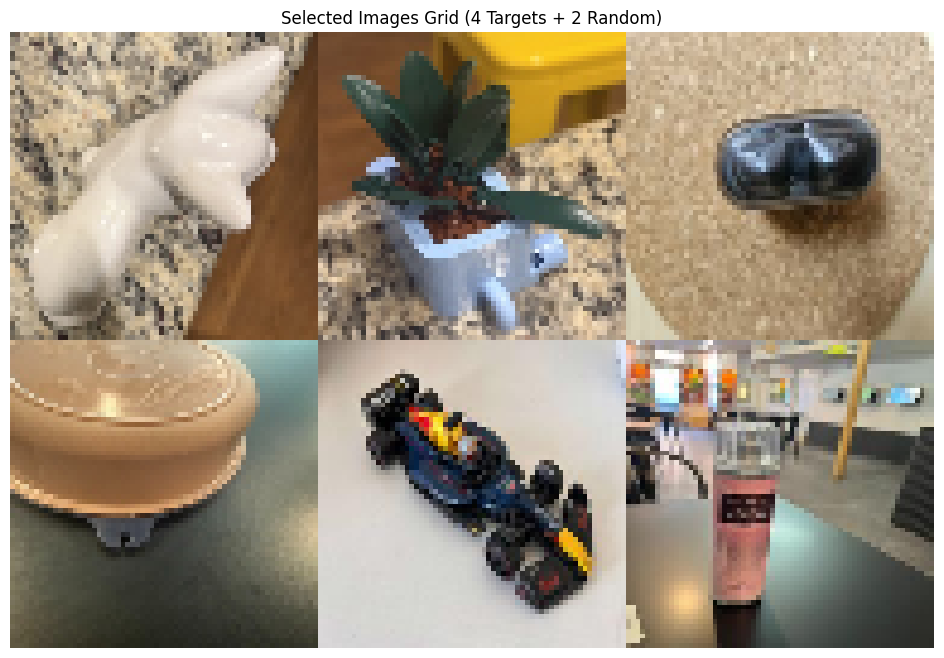

Grid arrangement (row-wise):
Row 1: ['IMAGES_OBJ789', 'IMAGES_OBJ788', 'images_OBJ003']
Row 2: ['images_OBJ222', 'image_OBJ787', 'IMAGES_OBJ786']


In [ ]:
import matplotlib.pyplot as plt

# Ensure image_grid exists
if "image_grid" in locals():
    plt.figure(figsize=(12, 8))

    # Check if we need to convert BGR (OpenCV default) to RGB (Matplotlib default)
    # The grid was created from images loaded via cv2.imread, which are BGR.
    if image_grid.shape[-1] == 3:
        # Convert BGR to RGB
        # Note: image_grid is float32 [0,1], cv2 handles this correctly
        image_grid_display = cv2.cvtColor(image_grid, cv2.COLOR_BGR2RGB)
    else:
        # Grayscale or other
        image_grid_display = image_grid

    # Display the grid
    if image_grid_display.ndim == 2:
        plt.imshow(image_grid_display, cmap='gray')
    else:
        plt.imshow(image_grid_display)

    plt.axis('off')
    plt.title("Selected Images Grid (4 Targets + 2 Random)")
    plt.show()

    # Print the labels corresponding to the grid for verification
    if "samples" in locals():
        print("Grid arrangement (row-wise):")
        labels_list = [str(s[1]) for s in samples[:6]]
        print(f"Row 1: {labels_list[:3]}")
        print(f"Row 2: {labels_list[3:]}")
else:
    print("image_grid variable not found. Please run the grid construction step.")

**GENERATING AND SAVING HIGH-RES IMAGE GRID**


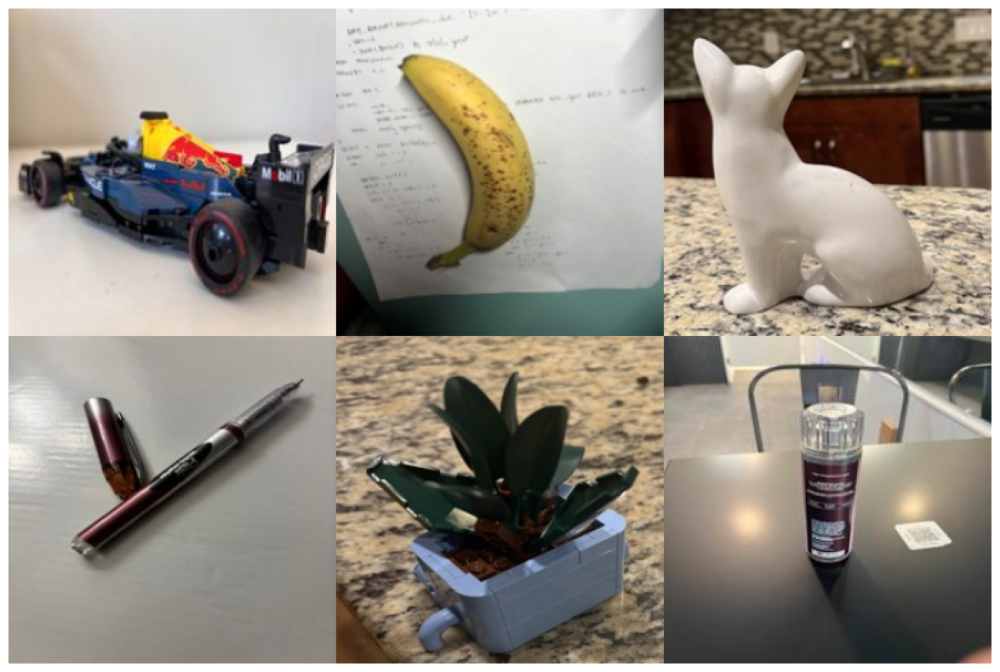

Grid Layout Labels:
Row 1: ('image_OBJ787', np.str_('images_OBJ229'), 'IMAGES_OBJ789')
Row 2: (np.str_('images_OBJ016'), 'IMAGES_OBJ788', 'IMAGES_OBJ786')

✓ High-resolution grid saved as 'high_res_grid.png'


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define paths and parameters
dataset_path = '/content/drive/MyDrive/Discriminative Project Milstone_1'
high_res_size = (256, 256)  # Increased resolution for better quality

# Target classes as identified previously
target_classes = ["IMAGES_OBJ786", "image_OBJ787", "IMAGES_OBJ788", "IMAGES_OBJ789"]

selected_paths = []
selected_labels = []

# 1. Find and select one image from each target class
if os.path.exists(dataset_path):
    # Get all available class directories
    all_classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]

    # Collect target images
    for target in target_classes:
        # Case-insensitive search for the folder
        found_dir = next((d for d in all_classes if d.lower() == target.lower()), None)

        if found_dir:
            dir_path = os.path.join(dataset_path, found_dir)
            # List valid images
            images_in_dir = [f for f in os.listdir(dir_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

            if images_in_dir:
                # Pick a random image from this class
                img_name = np.random.choice(images_in_dir)
                selected_paths.append(os.path.join(dir_path, img_name))
                selected_labels.append(found_dir)
            else:
                print(f"Warning: No images found in {found_dir}")
        else:
            print(f"Warning: Directory for {target} not found")

    # 2. Select 2 random images from other classes
    remaining_classes = [c for c in all_classes if c not in selected_labels]
    if len(remaining_classes) >= 2:
        random_classes = np.random.choice(remaining_classes, 2, replace=False)
        for rnd_cls in random_classes:
            dir_path = os.path.join(dataset_path, rnd_cls)
            images_in_dir = [f for f in os.listdir(dir_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            if images_in_dir:
                img_name = np.random.choice(images_in_dir)
                selected_paths.append(os.path.join(dir_path, img_name))
                selected_labels.append(rnd_cls)

    # 3. Load and Resize Images
    high_res_images = []
    for img_path in selected_paths:
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.resize(img, high_res_size)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB for matplotlib
            high_res_images.append(img)

    # 4. Create Grid (2x3)
    if len(high_res_images) >= 6:
        # Shuffle for display mix
        # Zip together to keep labels attached, shuffle, then unzip
        combined = list(zip(high_res_images, selected_labels))
        np.random.shuffle(combined)
        high_res_images, shuffled_labels = zip(*combined)

        rows = 2
        cols = 3
        h, w, c = high_res_size[0], high_res_size[1], 3

        grid = np.zeros((h * rows, w * cols, c), dtype=np.uint8)

        for i in range(rows * cols):
            r = i // cols
            c_idx = i % cols
            grid[r*h:(r+1)*h, c_idx*w:(c_idx+1)*w, :] = high_res_images[i]

        # 5. Display
        plt.figure(figsize=(15, 10))
        plt.imshow(grid)
        plt.axis('off')

        plt.show()

        print("Grid Layout Labels:")
        print(f"Row 1: {shuffled_labels[:3]}")
        print(f"Row 2: {shuffled_labels[3:]}")

        # 6. Save
        output_file = 'high_res_grid.png'
        # Convert RGB back to BGR for OpenCV saving
        cv2.imwrite(output_file, cv2.cvtColor(grid, cv2.COLOR_RGB2BGR))
        print(f"\n✓ High-resolution grid saved as '{output_file}'")

    else:
        print(f"Not enough images collected to form a 2x3 grid. Found {len(high_res_images)}.")
else:
    print("Dataset path not found.")

**GENERATING MULTIPLE RANDOM IMAGE GRIDS**


In [ ]:
import os
import cv2
import numpy as np
import random

# 1. Define dataset path and target classes
dataset_path = '/content/drive/MyDrive/Discriminative Project Milstone_1'
target_classes = ['IMAGES_OBJ786', 'image_OBJ787', 'IMAGES_OBJ788', 'IMAGES_OBJ789']

# 2. Set target resolution
img_h, img_w = 256, 256

# 3. Initialize list to store grids
generated_grids = []

if os.path.exists(dataset_path):
    # Get all class directories once
    all_classes = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]

    # 4. Loop 3 times
    for i in range(3):
        selected_paths = []
        selected_labels = []

        # 6. Select one image from each target class
        for target in target_classes:
            # Robust case-insensitive search for directory
            found_dir = next((d for d in all_classes if d.lower() == target.lower()), None)
            if found_dir:
                dir_path = os.path.join(dataset_path, found_dir)
                images = [f for f in os.listdir(dir_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
                if images:
                    img_name = random.choice(images)
                    selected_paths.append(os.path.join(dir_path, img_name))
                    selected_labels.append(found_dir)

        # 7. Identify remaining classes
        remaining_classes = [c for c in all_classes if c not in selected_labels]

        # 8. Select 2 random images from remaining classes
        if len(remaining_classes) >= 2:
            random_classes = random.sample(remaining_classes, 2)
            for rnd_cls in random_classes:
                dir_path = os.path.join(dataset_path, rnd_cls)
                images = [f for f in os.listdir(dir_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
                if images:
                    img_name = random.choice(images)
                    selected_paths.append(os.path.join(dir_path, img_name))

        # Only proceed if we have exactly 6 images (4 targets + 2 random)
        # Note: If a target class was empty, we might have fewer, but assuming dataset integrity based on previous steps.
        if len(selected_paths) == 6:
            # 9. Load, resize, and convert images
            loaded_images = []
            for p in selected_paths:
                img = cv2.imread(p)
                if img is not None:
                    img = cv2.resize(img, (img_w, img_h))
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    loaded_images.append(img)

            if len(loaded_images) == 6:
                # 10. Randomly shuffle
                random.shuffle(loaded_images)

                # 11. Create blank canvas (2 rows, 3 cols)
                grid_h = img_h * 2
                grid_w = img_w * 3
                grid = np.zeros((grid_h, grid_w, 3), dtype=np.uint8)

                # 12. Arrange images
                for idx, img in enumerate(loaded_images):
                    row = idx // 3
                    col = idx % 3
                    y_start, y_end = row * img_h, (row + 1) * img_h
                    x_start, x_end = col * img_w, (col + 1) * img_w
                    grid[y_start:y_end, x_start:x_end] = img

                # 13. Append to list
                generated_grids.append(grid)

    # 14. Print confirmation
    print(f"Generated {len(generated_grids)} additional grids.")
else:
    print("Dataset path not found.")

Generated 3 additional grids.


**DISPLAYING AND SAVING GENERATED IMAGE GRIDS**


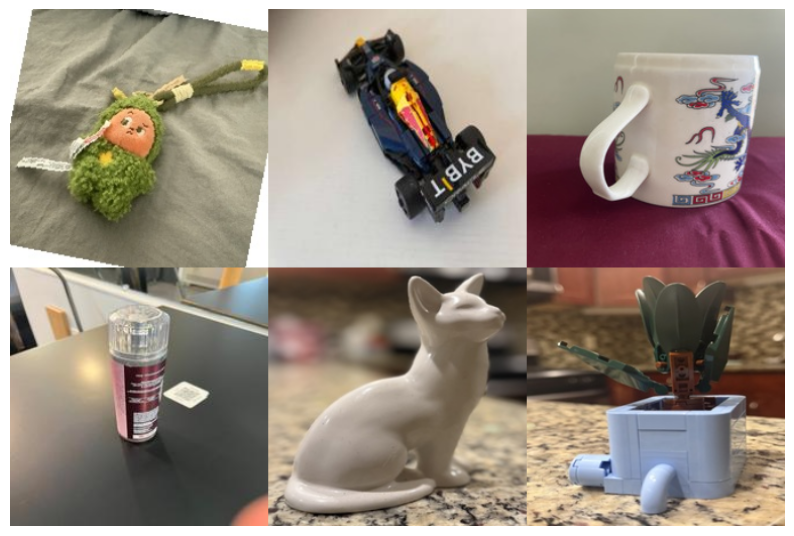

✓ Saved high_res_grid_2.png


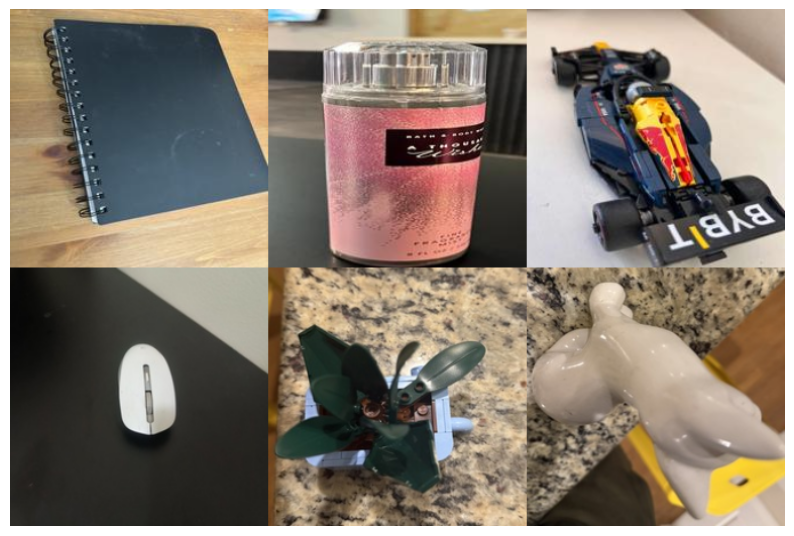

✓ Saved high_res_grid_3.png


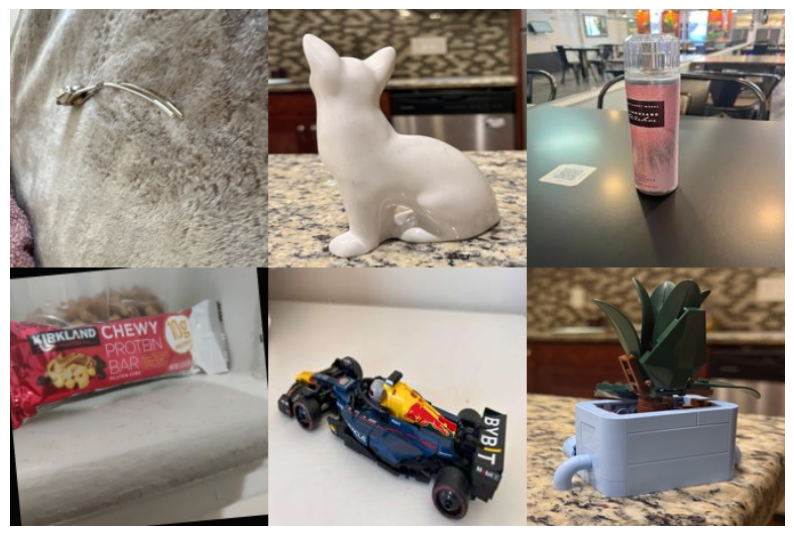

✓ Saved high_res_grid_4.png


In [ ]:
import matplotlib.pyplot as plt
import cv2

if "generated_grids" in locals() and len(generated_grids) > 0:
    for i, grid in enumerate(generated_grids):
        # Define filename (starting from 2)
        filename = f"high_res_grid_{i+2}.png"

        # Display the grid
        plt.figure(figsize=(10, 8))
        plt.imshow(grid)
        plt.axis('off')
        plt.show()

        # Save the grid (Convert RGB back to BGR for OpenCV)
        save_success = cv2.imwrite(filename, cv2.cvtColor(grid, cv2.COLOR_RGB2BGR))
        if save_success:
            print(f"\u2713 Saved {filename}")
        else:
            print(f"Error saving {filename}")
else:
    print("No generated grids found to save/display.")

**INSTALLING AND VERIFYING YOLO ENVIRONMENT**


In [ ]:
!pip install ultralytics

import ultralytics
ultralytics.checks()

Ultralytics 8.4.13 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 38.8/235.7 GB disk)


**PREPARING YOLO DATASET AND YAML CONFIGURATION**


In [ ]:
import os
import shutil
import numpy as np
from sklearn.model_selection import train_test_split
import yaml

# Define paths
source_path = '/content/drive/MyDrive/Discriminative Project Milstone_1'
yolo_base_path = '/content/yolo_dataset'

# 1. Collect all image paths and labels
print("Collecting image paths...")
all_files = []
classes = []

if os.path.exists(source_path):
    # Get sorted list of classes to ensure consistent mapping
    class_names = sorted([d for d in os.listdir(source_path) if os.path.isdir(os.path.join(source_path, d))])

    # Create class mapping
    class_to_id = {name: i for i, name in enumerate(class_names)}
    print(f"Found {len(class_names)} classes: {class_names[:5]}...")

    for class_name in class_names:
        class_dir = os.path.join(source_path, class_name)
        for filename in os.listdir(class_dir):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                filepath = os.path.join(class_dir, filename)
                all_files.append((filepath, class_to_id[class_name]))
else:
    print(f"Error: Source path '{source_path}' does not exist.")
    all_files = []

# 2. Split data (80% train, 20% val)
if len(all_files) > 0:
    train_files, val_files = train_test_split(all_files, test_size=0.2, random_state=42, stratify=[f[1] for f in all_files])
    print(f"Total images: {len(all_files)}")
    print(f"Training set: {len(train_files)}")
    print(f"Validation set: {len(val_files)}")

    # 3. Create directory structure
    for split in ['train', 'val']:
        for subdir in ['images', 'labels']:
            os.makedirs(os.path.join(yolo_base_path, split, subdir), exist_ok=True)

    # 4. Copy images and generate label files
    def process_dataset(files, split_name):
        print(f"Processing {split_name} set...")
        for i, (src_path, class_id) in enumerate(files):
            # Define file names
            filename = os.path.basename(src_path)
            base_name = os.path.splitext(filename)[0]

            # Destination paths
            dst_img_path = os.path.join(yolo_base_path, split_name, 'images', filename)
            dst_lbl_path = os.path.join(yolo_base_path, split_name, 'labels', f"{base_name}.txt")

            # Copy image
            shutil.copy(src_path, dst_img_path)

            # Create label file (class_id x_center y_center width height)
            # Assuming object covers entire image: 0.5 0.5 1.0 1.0
            with open(dst_lbl_path, 'w') as f:
                f.write(f"{class_id} 0.5 0.5 1.0 1.0\n")

    process_dataset(train_files, 'train')
    process_dataset(val_files, 'val')

    # 5. Create data.yaml
    data_yaml = {
        'path': yolo_base_path,
        'train': 'train/images',
        'val': 'val/images',
        'nc': len(class_names),
        'names': class_names
    }

    yaml_path = os.path.join(yolo_base_path, 'data.yaml')
    with open(yaml_path, 'w') as f:
        yaml.dump(data_yaml, f, default_flow_style=False)

    print(f"\nDataset preparation complete. stored at '{yolo_base_path}'")
    print(f"Configuration saved to '{yaml_path}'")

    # Display content of data.yaml
    print("\ndata.yaml content:")
    print(open(yaml_path).read())
else:
    print("No files found to process.")

Found 39 classes: ['IMAGES_OBJ786', 'IMAGES_OBJ788', 'IMAGES_OBJ789', 'Images_OBJ069', 'image_OBJ007']...
Total images: 4108
Training set: 3286
Validation set: 822
Processing train set...
Processing val set...

Dataset preparation complete. stored at '/content/yolo_dataset'
Configuration saved to '/content/yolo_dataset/data.yaml'

data.yaml content:
names:
- IMAGES_OBJ786
- IMAGES_OBJ788
- IMAGES_OBJ789
- Images_OBJ069
- image_OBJ007
- image_OBJ027
- image_OBJ090
- image_OBJ787
- images_OBJ001
- images_OBJ002
- images_OBJ003
- images_OBJ004
- images_OBJ005
- images_OBJ006
- images_OBJ008
- images_OBJ009
- images_OBJ010
- images_OBJ012
- images_OBJ016
- images_OBJ018
- images_OBJ019
- images_OBJ021
- images_OBJ022
- images_OBJ028
- images_OBJ029
- images_OBJ031
- images_OBJ061
- images_OBJ095
- images_OBJ107
- images_OBJ108
- images_OBJ111
- images_OBJ159
- images_OBJ208
- images_OBJ222
- images_OBJ229
- images_OBJ230
- images_OBJ311
- images_OBJ405
- images_OBJ_300
nc: 39
path: /conten

**TRAINING YOLOV8 MODEL ON CUSTOM DATASET**


In [ ]:
from ultralytics import YOLO

# Load the pre-trained YOLOv8 Nano model
model = YOLO('yolov8n.pt')

# Train the model on the custom dataset
print("Starting training...")
results = model.train(
    data='/content/yolo_dataset/data.yaml',
    epochs=3,
    imgsz=640
)

print("Training completed successfully.")

Starting training...
Ultralytics 8.4.13 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pati

**PERFORMING YOLO INFERENCE AND VISUALIZING DETECTIONS**


Loading model from /content/runs/detect/train/weights/best.pt...
Running inference on /content/high_res_grid.png...

image 1/1 /content/high_res_grid.png: 448x640 1 IMAGES_OBJ788, 1 image_OBJ787, 1 images_OBJ002, 1 images_OBJ016, 1 images_OBJ229, 40.1ms
Speed: 1.9ms preprocess, 40.1ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


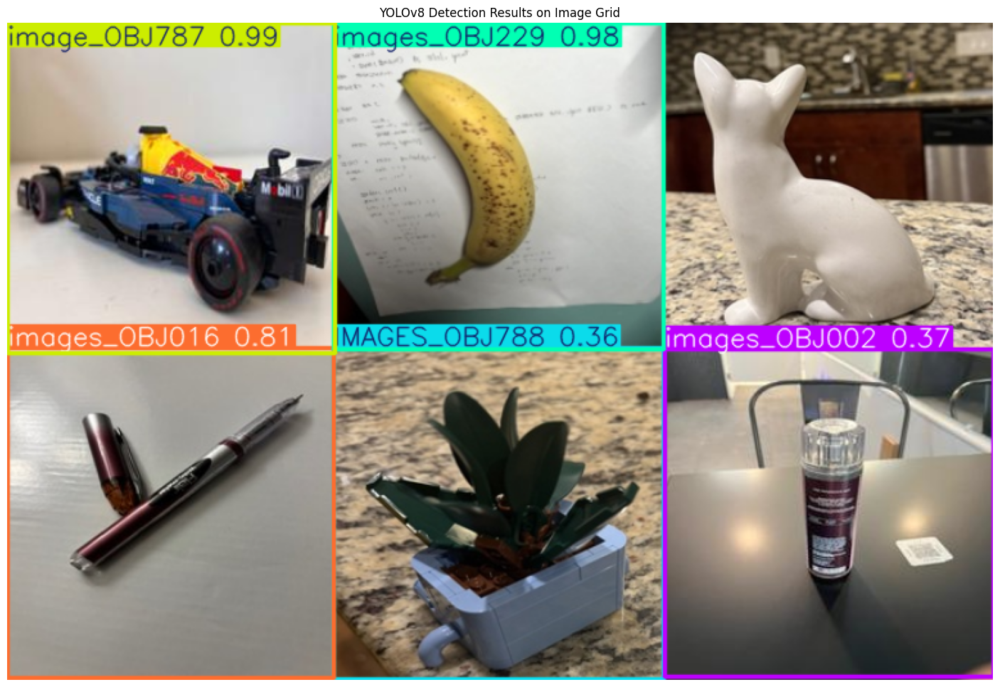

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import os

# Define path to the best trained model weights
# The results are typically saved in runs/detect/train/weights/best.pt
weights_path = '/content/runs/detect/train/weights/best.pt'
image_path = '/content/high_res_grid.png'

if os.path.exists(weights_path) and os.path.exists(image_path):
    print(f"Loading model from {weights_path}...")
    # Load the custom trained model
    best_model = YOLO(weights_path)

    # Run inference
    print(f"Running inference on {image_path}...")
    results = best_model.predict(source=image_path, conf=0.25, save=False)

    # Visualize results
    for result in results:
        # Plot the results on the image (returns a numpy array in BGR)
        im_array = result.plot()

        # Convert BGR to RGB for matplotlib display
        im_rgb = cv2.cvtColor(im_array, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(18, 12))
        plt.imshow(im_rgb)
        plt.axis('off')
        plt.title('YOLOv8 Detection Results on Image Grid')
        plt.show()
else:
    print(f"Error: File not found.\nWeights: {weights_path} ({os.path.exists(weights_path)})\nImage: {image_path} ({os.path.exists(image_path)})\nPlease check if training completed successfully.")

**RESUMING AND EXTENDING YOLO TRAINING**


In [ ]:
from ultralytics import YOLO
import os

# Define the path to the last trained weights
weights_path = '/content/runs/detect/train/weights/last.pt'

if os.path.exists(weights_path):
    print(f"Loading model from {weights_path} to continue training...")
    # Instantiate the model with the last weights
    model = YOLO(weights_path)

    # Continue training for 15 epochs
    print("Starting extended training...")
    results = model.train(
        data='/content/yolo_dataset/data.yaml',
        epochs=15,
        imgsz=640
    )
    print("Extended training completed.")
else:
    print(f"Error: Weights file not found at {weights_path}. Please ensure the previous training step completed successfully.")

Loading model from /content/runs/detect/train/weights/last.pt to continue training...
Starting extended training...
Ultralytics 8.4.13 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/train/weights/last.pt, momentum=0.937,

**BUILDING INTERACTIVE YOLO SEARCH AND GRID DISPLAY**


Falling back to standard 'yolov8n.pt'.
Please enter the Image ID or Class Name (e.g., image_OBJ787): image_OBJ787
Found Class 'image_OBJ787', selected sample: resized_WhatsApp Image 2026-01-30 at 1.46.22 PM (3).jpeg
Selecting random samples for grid...
Running YOLO inference on 16 images...


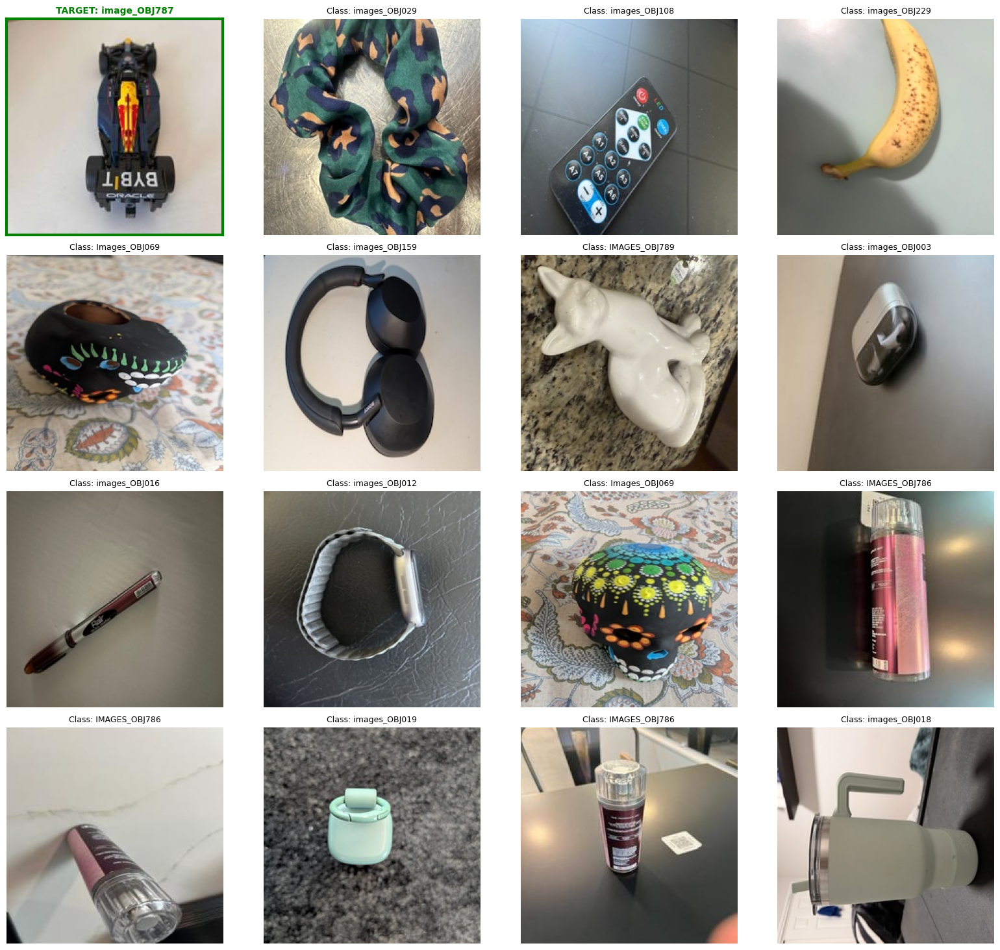

In [ ]:
!pip install ultralytics
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import glob
from ultralytics import YOLO
from google.colab import drive
import matplotlib.patches as patches

def search_and_display_grid():
    # 1. Setup Paths and Model
    if not os.path.exists('/content/drive'):
        print("Mounting Google Drive...")
        drive.mount('/content/drive')

    dataset_path = '/content/drive/MyDrive/Discriminative Project Milstone_1'
    if not os.path.exists(dataset_path):
        print(f"Dataset path not found at {dataset_path}")
        return

    # Robust Model Finding
    model_path = None
    found_models = glob.glob('/content/runs/**/weights/best.pt', recursive=True)
    if found_models:
        found_models.sort(key=os.path.getmtime, reverse=True)
        model_path = found_models[0]
        print(f"Loading custom model from {model_path}...")
        model = YOLO(model_path)
    else:
        print("Warning: Custom trained weights not found.")
        print("Falling back to standard 'yolov8n.pt'.")
        model = YOLO('yolov8n.pt')

    # 2. Ask for user input
    query = input("Please enter the Image ID or Class Name (e.g., image_OBJ787): ").strip()
    if not query:
        print("No input provided.")
        return

    # 3. Find Target Image
    target_path = None
    target_label = None

    def get_variants(name):
        name_lower = name.lower()
        variants = {name_lower}
        if 'image_' in name_lower:
            variants.add(name_lower.replace('image_', 'images_'))
        elif 'images_' in name_lower:
            variants.add(name_lower.replace('images_', 'image_'))
        return variants

    query_variants = get_variants(query)
    potential_dir = None
    for d in os.listdir(dataset_path):
        if d.lower() in query_variants:
            potential_dir = os.path.join(dataset_path, d)
            target_label = d
            break

    if potential_dir and os.path.isdir(potential_dir):
        files = [f for f in os.listdir(potential_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if files:
            target_path = os.path.join(potential_dir, np.random.choice(files))
            print(f"Found Class '{target_label}', selected sample: {os.path.basename(target_path)}")
        else:
            print(f"Class directory '{target_label}' is empty.")
            return
    else:
        print(f"Searching for file matching '{query}'...")
        for root, dirs, files in os.walk(dataset_path):
            for file in files:
                fname_lower = file.lower()
                fname_no_ext = os.path.splitext(file)[0].lower()
                if (fname_lower in query_variants) or (fname_no_ext in query_variants):
                    target_path = os.path.join(root, file)
                    target_label = os.path.basename(os.path.dirname(target_path))
                    print(f"Found exact file: {target_path}")
                    break
            if target_path: break

    if not target_path:
        print(f"Could not find any image or class matching '{query}'.")
        return

    # 4. Collect 15 Random Other Images
    print("Selecting random samples for grid...")
    other_paths = []
    class_dirs = [os.path.join(dataset_path, d) for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
    if class_dirs:
        attempts = 0
        while len(other_paths) < 15 and attempts < 200:
            attempts += 1
            rnd_dir = random.choice(class_dirs)
            try:
                fnames = [f for f in os.listdir(rnd_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
                if fnames:
                    path = os.path.join(rnd_dir, random.choice(fnames))
                    if path != target_path and path not in other_paths:
                        other_paths.append(path)
            except: continue

    # 5. Prepare Batch and Run Inference
    all_paths = [target_path] + other_paths
    print(f"Running YOLO inference on {len(all_paths)} images...")

    # Run prediction with low threshold to encourage detections
    results = model.predict(all_paths, conf=0.05, verbose=False)

    # 6. Plot 4x4 Grid
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    #model_name = "Custom Model" #if (model_path and "best.pt" in str(model_path)) else "Pre-trained (Generic)"
    #fig.suptitle(f"Query: '{query}' (Top-Left) + 15 Random Samples\nModel: {model_name}", fontsize=16, fontweight='bold')

    for i, ax in enumerate(axes.flat):
        if i < len(results):
            if i == 0:
                # --- TARGET IMAGE: Show Boxes ---
                # Plot model predictions
                plotted_img = results[i].plot(line_width=2,labels=False,conf=False,boxes=False)
                img_rgb = cv2.cvtColor(plotted_img, cv2.COLOR_BGR2RGB)
                ax.imshow(img_rgb)

                # Remove axis ticks and labels
                ax.set_xticks([])
                ax.set_yticks([])

                # Highlight the subplot
                ax.set_title(f"TARGET: {target_label}", color='green', fontweight='bold', fontsize=10)
                for spine in ax.spines.values():
                    spine.set_edgecolor('green')
                    spine.set_linewidth(3)

                # Force draw 'Ground Truth' bounding box
                #h, w = img_rgb.shape[:2]
                #rect = patches.Rectangle((5, 5), w-10, h-10, linewidth=3, edgecolor='lime', facecolor='none', linestyle='--')
                #ax.add_patch(rect)
            else:
                # --- OTHER IMAGES: Clean ---
                # Show original image without boxes
                orig_img = results[i].orig_img
                img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
                ax.imshow(img_rgb)

                parent_folder = os.path.basename(os.path.dirname(all_paths[i]))
                ax.set_title(f"Class: {parent_folder}", fontsize=9)
                ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    plt.show()

# Run the updated function
search_and_display_grid()

**UPLOADING IMAGE AND PREDICTING OBJECT ID USING YOLO**


Custom trained weights ('best.pt') not found at /content/runs/detect/train2/weights/best.pt.
Attempting to re-train a YOLOv8n model for 3 epochs to generate weights...
Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, m

Saving IMG_01.jpg to IMG_01.jpg
Uploaded file: IMG_01.jpg

Running inference on input image: IMG_01.jpg

OUTPUT OBJECT ID: images_OBJ095
Full Detections: [('images_OBJ095', 0.21343544125556946)]


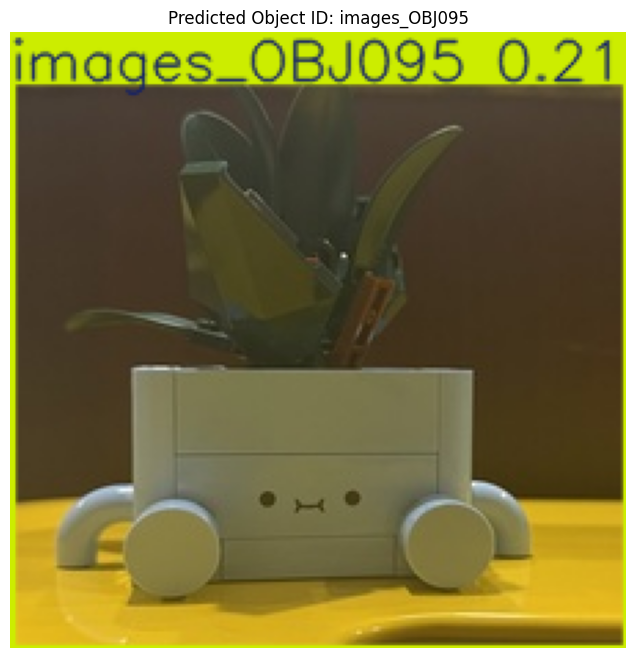

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import glob
from google.colab import drive
from google.colab import files # Import files for upload

def get_object_id_from_image(image_path=None):
    # Ensure Google Drive is mounted
    if not os.path.exists('/content/drive'):
        print("Mounting Google Drive...")
        try:
            drive.mount('/content/drive')
            print("Google Drive mounted successfully.")
        except Exception as e:
            print(f"Warning: Could not mount Google Drive. Error: {e}")
            return

    # 1. Load the Best Model
    # Explicitly setting the path to the best model from the 'train2' run
    model_path = '/content/runs/detect/train2/weights/best.pt'
    model = None # Initialize model as None

    if not os.path.exists(model_path):
        print(f"Custom trained weights ('best.pt') not found at {model_path}.")
        print("Attempting to re-train a YOLOv8n model for 3 epochs to generate weights...")
        try:
            temp_model = YOLO('yolov8n.pt') # Start with a fresh nano model
            # Retrain for a few epochs to generate a best.pt
            temp_results = temp_model.train(
                data='/content/yolo_dataset/data.yaml',
                epochs=3, # Brief training to quickly get a best.pt
                imgsz=640,
                project='runs/detect', # Keep it in the runs/detect directory
                name='temp_retrain' # Use a distinct name for this temporary run
            )
            # Get the path to the best model generated by this temporary training
            generated_model_path = temp_model.trainer.best
            if os.path.exists(generated_model_path):
                print(f"Successfully re-trained and found weights at: {generated_model_path}")
                model = YOLO(generated_model_path) # Load the newly generated best model
            else:
                print("Error: Re-training did not produce expected 'best.pt'. Falling back to default.")
                model = YOLO('yolov8n.pt')
        except Exception as e:
            print(f"Error during re-training attempt: {e}. Falling back to default.")
            model = YOLO('yolov8n.pt')
    else:
        print(f"Loading model from: {model_path}")
        model = YOLO(model_path)

    # If model is still None (e.g., if any of the above failed unexpectedly),
    # ensure a default model is loaded.
    if model is None:
        print("Failed to load or generate custom weights. Falling back to pre-trained 'yolov8n.pt'.")
        model = YOLO('yolov8n.pt')

    # 2. Determine Input Image
    if image_path is None:
        choice = input("Enter 'u' to upload an image, 'p' to provide a path, or 'r' for a random image: ").lower().strip()

        if choice == 'u':
            uploaded = files.upload()
            if uploaded:
                uploaded_filename = list(uploaded.keys())[0]
                image_path = uploaded_filename
                print(f"Uploaded file: {image_path}")
            else:
                print("No file uploaded. Exiting.")
                return
        elif choice == 'p':
            user_input_path = input("Please enter the path to the image (e.g., /content/drive/MyDrive/image.jpg): ").strip()
            if user_input_path:
                image_path = user_input_path
            else:
                print("No path provided. Exiting.")
                return
        elif choice == 'r':
            dataset_path = '/content/drive/MyDrive/Discriminative Project Milstone_1'
            if os.path.exists(dataset_path):
                all_images = []
                for root, dirs, files_in_dir in os.walk(dataset_path):
                    for file_name in files_in_dir:
                        if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                            all_images.append(os.path.join(root, file_name))

                if all_images:
                    image_path = np.random.choice(all_images)
                    print(f"\nSelected random image from dataset for demonstration:\n{image_path}")
                else:
                    print("No images found in dataset to test.")
                    return
            else:
                print(f"Dataset path '{dataset_path}' not found. Cannot select random image.")
                return
        else:
            print("Invalid choice. Exiting.")
            return

    # 3. Run Inference
    if os.path.exists(image_path):
        print(f"\nRunning inference on input image: {image_path}")
        # Lower confidence threshold for detection to show more results
        results = model.predict(image_path, conf=0.15, verbose=False)

        # 4. Process Output
        result = results[0]

        # Get the class ID(s) and Names
        detected_objects = []
        if result.boxes:
            for box in result.boxes:
                cls_id = int(box.cls[0])
                cls_name = model.names[cls_id]
                conf = float(box.conf[0])
                detected_objects.append((cls_name, conf))

            # Sort by confidence
            detected_objects.sort(key=lambda x: x[1], reverse=True)

            # Output the top prediction
            if detected_objects:
                top_prediction = detected_objects[0][0]
                print("\n" + "="*30)
                print(f"OUTPUT OBJECT ID: {top_prediction}")
                print("="*30)
                print(f"Full Detections: {detected_objects}")

            # 5. Display Image with Bounding Box
            res_plotted = result.plot()
            plt.figure(figsize=(8, 8))
            plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
            plt.title(f"Predicted Object ID: {top_prediction}")
            plt.axis('off')
            plt.show()

        else:
            print("\nNo objects detected in the image with current confidence threshold.")
            # Show original image
            img = cv2.imread(image_path)
            plt.figure(figsize=(8, 8))
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title("No Detections")
            plt.axis('off')
            plt.show()

    else:
        print(f"Error: Input image path '{image_path}' does not exist.")

# --- Example Usage ---
# Call the function without arguments to let the user choose an input method
get_object_id_from_image()

# Or, provide a specific path directly:
# my_image_path = '/content/drive/MyDrive/Discriminative Project Milstone_1/IMAGES_OBJ786/image_2023-03-01_11-30-00.jpg'
# get_object_id_from_image(my_image_path)

**VERIFYING YOLO TRAINING RUN DIRECTORIES**


In [ ]:
import os

print("Contents of /content/runs/detect:")
!ls -F /content/runs/detect

Contents of /content/runs/detect:
runs/  train/  train2/


**AUTO-DETECTING BEST YOLO MODEL AND PREDICTING OBJECT ID**


Found latest best.pt at: /content/runs/detect/runs/detect/temp_retrain6/weights/best.pt
Loading custom model from: /content/runs/detect/runs/detect/temp_retrain6/weights/best.pt
Enter 'u' to upload an image, 'p' to provide a path, or 'r' for a random image: u


Saving IMG_00.jpg to IMG_00.jpg
Uploaded file: IMG_00.jpg

Running inference on input image: IMG_00.jpg

OUTPUT OBJECT ID: IMAGES_OBJ789


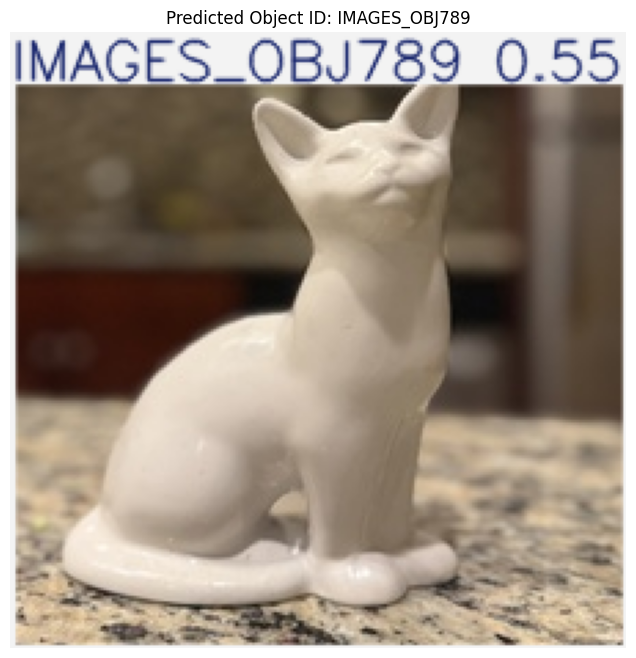

Full Detections: [('IMAGES_OBJ789', 0.5467489957809448)]


In [ ]:
import os
import glob
from ultralytics import YOLO
from google.colab import drive
from google.colab import files # Import files for upload
import cv2
import numpy as np
import matplotlib.pyplot as plt

def find_best_model_path():
    base_dir = '/content/runs/detect'
    all_best_pts = []

    # Find all directories that start with 'train' or 'temp_retrain'
    # The 'temp_retrain' prefix is used for models generated by fallback re-training.
    for train_dir in glob.glob(os.path.join(base_dir, 'train*')) + glob.glob(os.path.join(base_dir, 'runs/detect/temp_retrain*')):
        weights_path = os.path.join(train_dir, 'weights', 'best.pt')
        if os.path.exists(weights_path):
            all_best_pts.append((weights_path, os.path.getmtime(weights_path)))

    if not all_best_pts:
        return None

    # Sort by modification time to get the latest one
    all_best_pts.sort(key=lambda x: x[1], reverse=True)
    latest_best_pt = all_best_pts[0][0]

    print(f"Found latest best.pt at: {latest_best_pt}")
    return latest_best_pt

# Modify get_object_id_from_image to use this function
def get_object_id_from_image(image_path=None):
    # Ensure Google Drive is mounted
    if not os.path.exists('/content/drive'):
        print("Mounting Google Drive...")
        try:
            drive.mount('/content/drive')
            print("Google Drive mounted successfully.")
        except Exception as e:
            print(f"Warning: Could not mount Google Drive. Error: {e}")
            return

    # 1. Load the Best Model dynamically
    model_weights_to_load = find_best_model_path()

    if model_weights_to_load and os.path.exists(model_weights_to_load):
        print(f"Loading custom model from: {model_weights_to_load}")
        model = YOLO(model_weights_to_load)
    else:
        print("No custom trained weights found. Falling back to pre-trained 'yolov8n.pt'.")
        model = YOLO('yolov8n.pt')

    # 2. Determine Input Image
    if image_path is None:
        choice = input("Enter 'u' to upload an image, 'p' to provide a path, or 'r' for a random image: ").lower().strip()

        if choice == 'u':
            uploaded = files.upload()
            if uploaded:
                uploaded_filename = list(uploaded.keys())[0]
                image_path = uploaded_filename
                print(f"Uploaded file: {image_path}")
            else:
                print("No file uploaded. Exiting.")
                return
        elif choice == 'p':
            user_input_path = input("Please enter the path to the image (e.g., /content/drive/MyDrive/image.jpg): ").strip()
            if user_input_path:
                image_path = user_input_path
            else:
                print("No path provided. Exiting.")
                return
        elif choice == 'r':
            dataset_path = '/content/drive/MyDrive/Discriminative Project Milstone_1'
            if os.path.exists(dataset_path):
                all_images = []
                for root, dirs, files_in_dir in os.walk(dataset_path):
                    for file_name in files_in_dir:
                        if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                            all_images.append(os.path.join(root, file_name))

                if all_images:
                    image_path = np.random.choice(all_images)
                    print(f"\nSelected random image from dataset for demonstration:\n{image_path}")
                else:
                    print("No images found in dataset to test.")
                    return
            else:
                print(f"Dataset path '{dataset_path}' not found. Cannot select random image.")
                return
        else:
            print("Invalid choice. Exiting.")
            return

    # 3. Run Inference
    if os.path.exists(image_path):
        print(f"\nRunning inference on input image: {image_path}")
        # Lower confidence threshold for detection to show more results
        results = model.predict(image_path, conf=0.15, verbose=False)

        # 4. Process Output
        result = results[0]

        # Get the class ID(s) and Names
        detected_objects = []
        if result.boxes:
            for box in result.boxes:
                cls_id = int(box.cls[0])
                cls_name = model.names[cls_id]
                conf = float(box.conf[0])
                detected_objects.append((cls_name, conf))

            # Sort by confidence
            detected_objects.sort(key=lambda x: x[1], reverse=True)

            # Output the top prediction
            if detected_objects:
                top_prediction = detected_objects[0][0]
                print("\n" + "="*30)
                print(f"OUTPUT OBJECT ID: {top_prediction}")
                print("="*30)

            # 5. Display Image with Bounding Box
            res_plotted = result.plot()
            plt.figure(figsize=(8, 8))
            plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
            plt.title(f"Predicted Object ID: {top_prediction}")
            plt.axis('off')
            plt.show()

            # Also print detailed detections
            print(f"Full Detections: {detected_objects}")
        else:
            print("\nNo objects detected in the image with current confidence threshold.")
            # Show original image
            img = cv2.imread(image_path)
            plt.figure(figsize=(8, 8))
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title("No Detections")
            plt.axis('off')
            plt.show()

    else:
        print(f"Error: Input image path '{image_path}' does not exist.")

# --- Example Usage ---
# Call the function without arguments to let the user choose an input method
get_object_id_from_image()

***LIVE DEMO TESTING***

**INSTALLING YOLO AND IMPORTING DEPENDENCIES**


In [ ]:
# Install YOLO (safe even if already installed)
!pip install ultralytics -q

import os
import glob
from ultralytics import YOLO


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 28.1 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


**SEARCHING AND LISTING TRAINED YOLO WEIGHTS FILES**


In [ ]:
import glob, os

paths = glob.glob("/content/**/best.pt", recursive=True) + glob.glob("/content/drive/**/best.pt", recursive=True)
paths = [p for p in paths if "weights" in p]

print("Found best.pt files:")
for p in sorted(paths, key=os.path.getmtime, reverse=True):
    print(p)


Found best.pt files:


**REBUILDING YOLO DATASET, TRAINING, AND DETECTING UPLOADED IMAGES**


Rebuilding YOLO dataset...
Dataset rebuilt successfully.

Starting FAST training...
Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=fast_run2, nbs=64, nms=False, 

Saving image_m2 7.jpg to image_m2 7 (1).jpg

Processing: image_m2 7 (1).jpg
OUTPUT OBJ ID: images_OBJ061
All detections: [('images_OBJ061', 0.9842235445976257), ('images_OBJ111', 0.969733715057373), ('images_OBJ021', 0.9238341450691223), ('images_OBJ004', 0.5692143440246582)]


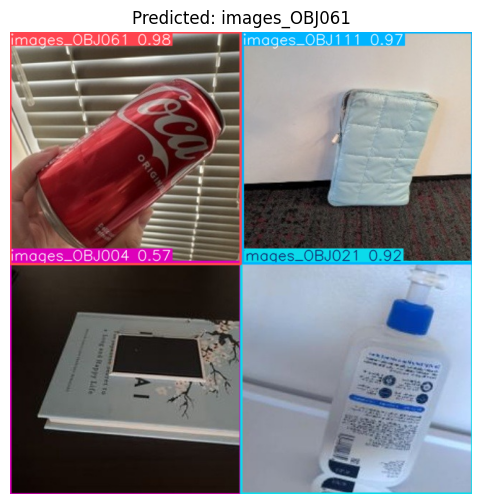

In [ ]:
!pip install -q ultralytics

import os
import shutil
import yaml
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
from google.colab import drive, files
import matplotlib.pyplot as plt

# MOUNT DRIVE

if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

source_path = '/content/drive/MyDrive/Discriminative Project Milstone_1'
yolo_base_path = '/content/yolo_dataset'

# REBUILD YOLO DATASET

print("Rebuilding YOLO dataset...")

all_files = []
class_names = sorted([d for d in os.listdir(source_path) if os.path.isdir(os.path.join(source_path, d))])
class_to_id = {name: i for i, name in enumerate(class_names)}

for class_name in class_names:
    class_dir = os.path.join(source_path, class_name)
    for file in os.listdir(class_dir):
        if file.lower().endswith(('.jpg','.jpeg','.png')):
            all_files.append((os.path.join(class_dir,file), class_to_id[class_name]))

train_files, val_files = train_test_split(
    all_files, test_size=0.2, random_state=42,
    stratify=[f[1] for f in all_files]
)

for split in ['train','val']:
    for sub in ['images','labels']:
        os.makedirs(os.path.join(yolo_base_path, split, sub), exist_ok=True)

def process(files, split):
    for src_path, class_id in files:
        filename = os.path.basename(src_path)
        base = os.path.splitext(filename)[0]

        dst_img = os.path.join(yolo_base_path, split, 'images', filename)
        dst_lbl = os.path.join(yolo_base_path, split, 'labels', base + '.txt')

        shutil.copy(src_path, dst_img)

        with open(dst_lbl, 'w') as f:
            f.write(f"{class_id} 0.5 0.5 1.0 1.0\n")

process(train_files,'train')
process(val_files,'val')

data_yaml = {
    'path': yolo_base_path,
    'train': 'train/images',
    'val': 'val/images',
    'nc': len(class_names),
    'names': class_names
}

with open(os.path.join(yolo_base_path,'data.yaml'),'w') as f:
    yaml.dump(data_yaml,f)

print("Dataset rebuilt successfully.")

# FAST TRAIN

print("\nStarting FAST training...")

model = YOLO("yolov8n.pt")

model.train(
    data=os.path.join(yolo_base_path,'data.yaml'),
    epochs=5,
    imgsz=320,
    batch=16,
    name="fast_run"
)

weights_path = '/content/runs/detect/fast_run/weights/best.pt'

if not os.path.exists(weights_path):
    raise FileNotFoundError("Training failed: best.pt not found.")

print("Training completed.")

# UPLOAD & DETECT

print("\nUpload 4 JPG images now:")
uploaded = files.upload()

demo_model = YOLO(weights_path)

for img_path in uploaded.keys():
    print("\n==============================")
    print("Processing:", img_path)

    result = demo_model.predict(img_path, conf=0.15, verbose=False)[0]

    if len(result.boxes)==0:
        print("No detection.")
        continue

    detections=[]
    for b in result.boxes:
        cls_id=int(b.cls[0])
        detections.append((demo_model.names[cls_id], float(b.conf[0])))

    detections.sort(key=lambda x:x[1], reverse=True)

    print("OUTPUT OBJ ID:", detections[0][0])
    print("All detections:", detections)

    plotted=result.plot()
    plt.figure(figsize=(6,6))
    plt.imshow(cv2.cvtColor(plotted, cv2.COLOR_BGR2RGB))
    plt.title(f"Predicted: {detections[0][0]}")
    plt.axis('off')
    plt.show()


**SLICING GRID IMAGE AND EXTRACTING TILE-WISE OBJECT IDS**


✅ Using weights: /content/runs/detect/fast_run/weights/best.pt

📌 Upload ONE GRID image:


Saving image_m1 7.jpg to image_m1 7 (4).jpg
Grid image size: 1076x1106
Rows = 3
Cols = 4
Gap between tiles in pixels (Enter for 0): 
Confidence (Enter for 0.15): 

✅ Slicing 3x4 | tile 269x368 | gap=0

✅ OBJ IDs (row-wise):
Row 1: ['images_OBJ012', 'images_OBJ230', 'images_OBJ018', 'image_OBJ787']
Row 2: ['image_OBJ090', 'Images_OBJ069', 'images_OBJ002', 'images_OBJ008']
Row 3: ['images_OBJ031', 'Images_OBJ069', 'images_OBJ005', 'images_OBJ_300']


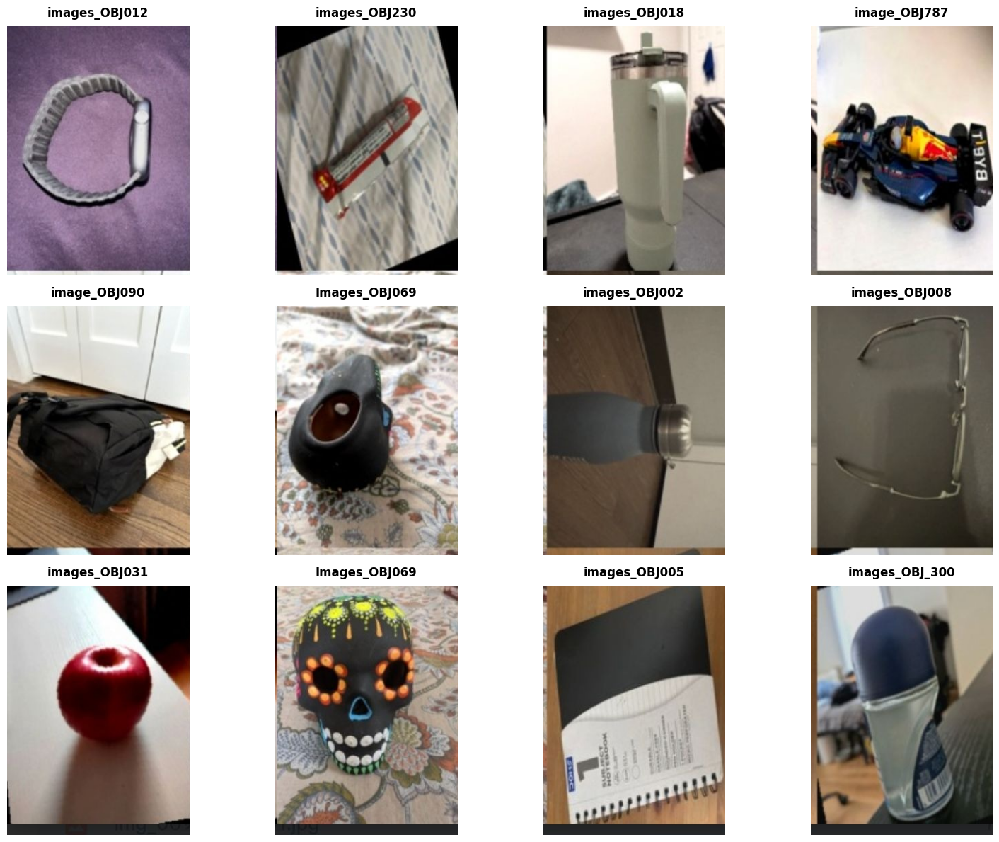

In [ ]:
!pip install -q ultralytics

import os, glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab import files

def find_best_pt():
    p1 = "/content/runs/detect/fast_run/weights/best.pt"
    if os.path.exists(p1):
        return p1
    cands = glob.glob("/content/runs/detect/**/weights/best.pt", recursive=True)
    if not cands:
        return None
    cands.sort(key=os.path.getmtime, reverse=True)
    return cands[0]

WEIGHTS = find_best_pt()
if WEIGHTS is None:
    raise FileNotFoundError("best.pt not found. Train first.")

print(" Using weights:", WEIGHTS)
model = YOLO(WEIGHTS)

print("\n Upload ONE GRID image:")
uploaded = files.upload()
grid_path = list(uploaded.keys())[0]

img = cv2.imread(grid_path)
if img is None:
    raise ValueError("Could not read image.")

H, W = img.shape[:2]
print(f"Grid image size: {W}x{H}")

rows = int(input("Rows = ").strip())
cols = int(input("Cols = ").strip())

gap = input("Gap between tiles in pixels (Enter for 0): ").strip()
gap = int(gap) if gap != "" else 0

conf = input("Confidence (Enter for 0.15): ").strip()
conf = float(conf) if conf != "" else 0.15

tile_h = (H - (rows - 1) * gap) // rows
tile_w = (W - (cols - 1) * gap) // cols

if tile_h <= 0 or tile_w <= 0:
    raise ValueError("Invalid tile size. Check rows/cols/gap.")

print(f"\n Slicing {rows}x{cols} | tile {tile_w}x{tile_h} | gap={gap}\n")

pred_matrix = []
tile_images_rgb = []

for r in range(rows):
    row_preds = []
    for c in range(cols):
        y1 = r * (tile_h + gap)
        x1 = c * (tile_w + gap)
        y2 = y1 + tile_h
        x2 = x1 + tile_w

        tile = img[y1:y2, x1:x2].copy()

        res = model.predict(tile, conf=conf, verbose=False)[0]

        if res.boxes is None or len(res.boxes) == 0:
            pred = "NO_DET"
        else:
            # highest confidence class
            best_i = int(np.argmax(res.boxes.conf.cpu().numpy()))
            cls_id = int(res.boxes.cls[best_i].item())
            pred = model.names[cls_id]

        row_preds.append(pred)

        # show CLEAN tile (no boxes, no labels)
        tile_rgb = cv2.cvtColor(tile, cv2.COLOR_BGR2RGB)
        tile_images_rgb.append(tile_rgb)

    pred_matrix.append(row_preds)

# Print row-wise predictions
print(" OBJ IDs (row-wise):")
for r in range(rows):
    print(f"Row {r+1}: {pred_matrix[r]}")

# ----------- CLEAN DISPLAY (NO OVERLAP) -----------
fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))

if rows == 1 and cols == 1:
    axes = np.array([[axes]])
elif rows == 1:
    axes = np.array([axes])
elif cols == 1:
    axes = np.array([[ax] for ax in axes])

idx = 0
for r in range(rows):
    for c in range(cols):
        ax = axes[r, c]
        ax.imshow(tile_images_rgb[idx])
        ax.axis("off")

        # Put label BELOW image, not on image
        ax.set_title(pred_matrix[r][c], fontsize=12, fontweight="bold", pad=10)
        idx += 1

plt.tight_layout()
plt.show()


**FAST YOLO DATASET REBUILD USING SYMLINKS**


In [ ]:
!pip install -q ultralytics

import os, yaml, random
from sklearn.model_selection import train_test_split
from google.colab import drive

# Mount Drive
if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

source_path = '/content/drive/MyDrive/Discriminative Project Milstone_1'
yolo_base = '/content/yolo_dataset'

print("FAST rebuild (symlinks, not copy)...")

# Collect classes
class_names = sorted([d for d in os.listdir(source_path)
                      if os.path.isdir(os.path.join(source_path, d))])
class_to_id = {name:i for i,name in enumerate(class_names)}

all_files = []
for cname in class_names:
    folder = os.path.join(source_path, cname)
    for f in os.listdir(folder):
        if f.lower().endswith(('.jpg','.jpeg','.png')):
            all_files.append((os.path.join(folder,f), class_to_id[cname]))

print("Total images found:", len(all_files), " | classes:", len(class_names))

train_files, val_files = train_test_split(
    all_files, test_size=0.2, random_state=42,
    stratify=[x[1] for x in all_files]
)

# Make folders
for split in ['train','val']:
    os.makedirs(os.path.join(yolo_base, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(yolo_base, split, 'labels'), exist_ok=True)

def link_and_label(files, split):
    for src_path, cid in files:
        fname = os.path.basename(src_path)
        base = os.path.splitext(fname)[0]

        dst_img = os.path.join(yolo_base, split, 'images', fname)
        dst_lbl = os.path.join(yolo_base, split, 'labels', base + '.txt')

        # symlink (instant) instead of copy (slow)
        if not os.path.exists(dst_img):
            os.symlink(src_path, dst_img)

        # label file
        if not os.path.exists(dst_lbl):
            with open(dst_lbl, 'w') as f:
                f.write(f"{cid} 0.5 0.5 1.0 1.0\n")

link_and_label(train_files, 'train')
link_and_label(val_files, 'val')

# data.yaml
data_yaml = {
    'path': yolo_base,
    'train': 'train/images',
    'val': 'val/images',
    'nc': len(class_names),
    'names': class_names
}
yaml_path = os.path.join(yolo_base,'data.yaml')
with open(yaml_path,'w') as f:
    yaml.dump(data_yaml,f)

print(" DONE. data.yaml at:", yaml_path)

FAST rebuild (symlinks, not copy)...
Total images found: 4108  | classes: 39
✅ DONE. data.yaml at: /content/yolo_dataset/data.yaml


**EMERGENCY YOLO TRAINING AND SAVING BEST WEIGHTS TO DRIVE**


In [ ]:
from ultralytics import YOLO
import os, shutil

DATA_YAML = "/content/yolo_dataset/data.yaml"
model = YOLO("yolov8n.pt")

model.train(
    data=DATA_YAML,
    epochs=3,
    imgsz=320,
    batch=16,
    name="emergency_run"
)

best_pt = "/content/runs/detect/emergency_run/weights/best.pt"
print(" best.pt:", best_pt, "exists?", os.path.exists(best_pt))

# Save permanently to Drive (IMPORTANT)
save_path = "/content/drive/MyDrive/best_saved.pt"
shutil.copy(best_pt, save_path)
print(" Saved to Drive:", save_path)

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.10.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=emergency_run, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, pe

**RETRAINING YOLO AND PERMANENTLY SAVING BEST MODEL TO DRIVE**


In [ ]:
from ultralytics import YOLO
import os, shutil

DATA_YAML = "/content/yolo_dataset/data.yaml"

model = YOLO("yolov8n.pt")

model.train(
    data=DATA_YAML,
    epochs=3,      # fast
    imgsz=320,     # fast
    batch=16,
    name="emergency_run"
)

best_pt = "/content/runs/detect/emergency_run/weights/best.pt"
print("best.pt exists?", os.path.exists(best_pt))

# ✅ Save permanently to Drive so it never disappears again
save_path = "/content/drive/MyDrive/best_saved.pt"
shutil.copy(best_pt, save_path)
print("✅ Saved to Drive:", save_path)

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.10.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=emergency_run2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, p

**UPLOADING IMAGE AND PREDICTING OBJECT ID USING SAVED YOLO MODEL**


Upload ONE image now:


Saving 1 7.jpg to 1 7 (2).jpg
✅ OUTPUT OBJECT ID: images_OBJ031 | confidence: 0.982


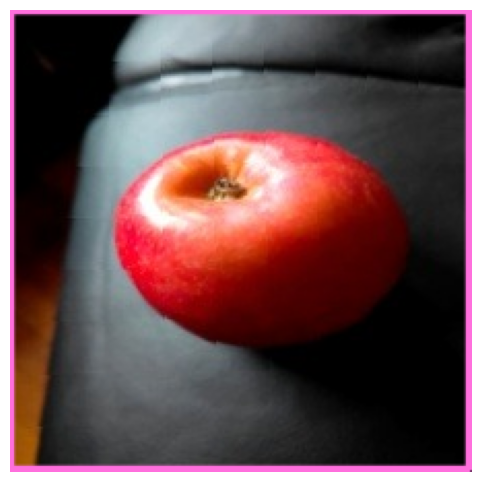

In [ ]:
from ultralytics import YOLO
from google.colab import files
import cv2
import matplotlib.pyplot as plt

model = YOLO("/content/drive/MyDrive/best_saved.pt")

print("Upload ONE image now:")
uploaded = files.upload()
img_path = list(uploaded.keys())[0]

res = model.predict(img_path, conf=0.15, verbose=False)[0]

if res.boxes is None or len(res.boxes) == 0:
    print("❌ No detection")
else:
    best_i = int(res.boxes.conf.argmax().item())
    cls_id = int(res.boxes.cls[best_i].item())
    conf = float(res.boxes.conf[best_i].item())

    print("✅ OUTPUT OBJECT ID:", model.names[cls_id], "| confidence:", round(conf, 3))

    plotted = res.plot(labels=False, conf=False)
    plt.figure(figsize=(6,6))
    plt.imshow(cv2.cvtColor(plotted, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

Upload ONE image now:


Saving 2 7.jpg to 2 7.jpg
✅ OUTPUT OBJECT ID: images_OBJ022 | confidence: 0.445


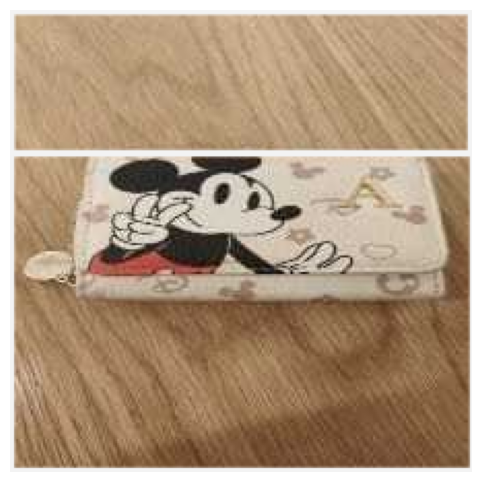

In [ ]:
from ultralytics import YOLO
from google.colab import files
import cv2
import matplotlib.pyplot as plt

model = YOLO("/content/drive/MyDrive/best_saved.pt")

print("Upload ONE image now:")
uploaded = files.upload()
img_path = list(uploaded.keys())[0]

res = model.predict(img_path, conf=0.15, verbose=False)[0]

if res.boxes is None or len(res.boxes) == 0:
    print("❌ No detection")
else:
    best_i = int(res.boxes.conf.argmax().item())
    cls_id = int(res.boxes.cls[best_i].item())
    conf = float(res.boxes.conf[best_i].item())

    print("✅ OUTPUT OBJECT ID:", model.names[cls_id], "| confidence:", round(conf, 3))

    plotted = res.plot(labels=False, conf=False)
    plt.figure(figsize=(6,6))
    plt.imshow(cv2.cvtColor(plotted, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()